In [ ]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(10)

# Reproducible random generator
RNG = np.random.default_rng(10)


## 1. Dataset generation

In [ ]:
def generate_gaussian_dataset(n_per_class=500, seed=10):
    """Generate a 2-D, 3-class linearly separable Gaussian dataset."""
    rng = np.random.default_rng(seed)

    means = np.array([
        [-2.5, -1.5],
        [ 2.5, -1.0],
        [ 0.0,  2.5]
    ])

    covariances = [
        np.array([[0.55, 0.00], [0.00, 0.45]]),
        np.array([[0.50, 0.05], [0.05, 0.55]]),
        np.array([[0.45, -0.03], [-0.03, 0.50]])
    ]

    X_parts, y_parts = [], []

    for c in range(3):
        Xc = rng.multivariate_normal(means[c], covariances[c], n_per_class)
        yc = np.full(n_per_class, c)
        X_parts.append(Xc)
        y_parts.append(yc)

    X = np.vstack(X_parts)
    y = np.concatenate(y_parts)

    return X, y


def generate_spiral_dataset(n_per_class=500, noise=0.20, seed=10):
    """Generate a 2-D, 3-class interleaving spiral dataset."""
    rng = np.random.default_rng(seed)

    X = np.zeros((n_per_class * 3, 2))
    y = np.zeros(n_per_class * 3, dtype=int)

    for c in range(3):
        start = c * n_per_class
        end = (c + 1) * n_per_class

        r = np.linspace(0.05, 1.0, n_per_class)
        theta = np.linspace(c * 4.0, (c + 1) * 4.0, n_per_class)

        theta += rng.normal(0, noise, n_per_class)
        r += rng.normal(0, noise * 0.08, n_per_class)

        X[start:end, 0] = r * np.sin(theta)
        X[start:end, 1] = r * np.cos(theta)
        y[start:end] = c

    return X, y


X_gauss, y_gauss = generate_gaussian_dataset()
X_spiral, y_spiral = generate_spiral_dataset()

print("Gaussian:", X_gauss.shape, y_gauss.shape)
print("Spiral  :", X_spiral.shape, y_spiral.shape)


Gaussian: (1500, 2) (1500,)
Spiral  : (1500, 2) (1500,)


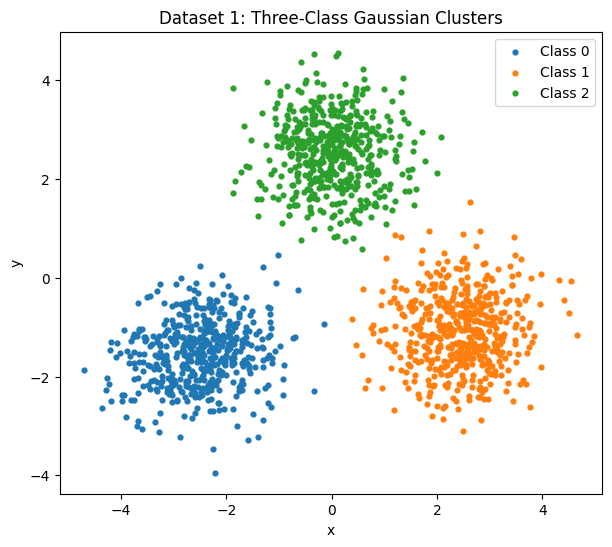

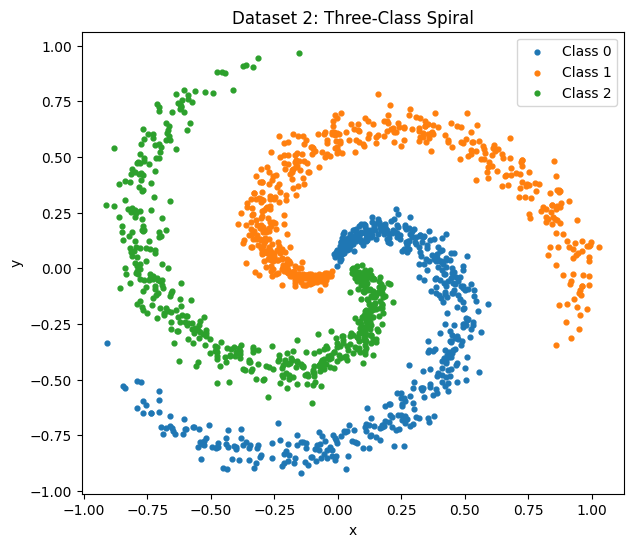

In [ ]:
def plot_dataset(X, y, title):
    plt.figure(figsize=(7, 6))
    for c in range(3):
        mask = y == c
        plt.scatter(X[mask, 0], X[mask, 1], s=12, label=f"Class {c}")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title(title)
    plt.legend()
    plt.show()


plot_dataset(X_gauss, y_gauss, "Dataset 1: Three-Class Gaussian Clusters")
plot_dataset(X_spiral, y_spiral, "Dataset 2: Three-Class Spiral")


## 2. Stratified 60%-20%-20% split

In [ ]:
def stratified_split(X, y, train_ratio=0.60, val_ratio=0.20, seed=10):
    """Split each class independently into train/validation/test."""
    rng = np.random.default_rng(seed)

    train_idx, val_idx, test_idx = [], [], []

    for c in np.unique(y):
        idx = np.where(y == c)[0]
        rng.shuffle(idx)

        n = len(idx)
        n_train = int(train_ratio * n)
        n_val = int(val_ratio * n)

        train_idx.extend(idx[:n_train])
        val_idx.extend(idx[n_train:n_train + n_val])
        test_idx.extend(idx[n_train + n_val:])

    train_idx = np.array(train_idx)
    val_idx = np.array(val_idx)
    test_idx = np.array(test_idx)

    rng.shuffle(train_idx)
    rng.shuffle(val_idx)
    rng.shuffle(test_idx)

    return (
        X[train_idx], y[train_idx],
        X[val_idx], y[val_idx],
        X[test_idx], y[test_idx]
    )


def standardize_from_train(X_train, X_val, X_test):
    """Standardize using training statistics only."""
    mean = X_train.mean(axis=0)
    std = X_train.std(axis=0)
    std[std == 0] = 1.0

    return (
        (X_train - mean) / std,
        (X_val - mean) / std,
        (X_test - mean) / std
    )


datasets = {}

for name, (X, y) in {
    "Gaussian": (X_gauss, y_gauss),
    "Spiral": (X_spiral, y_spiral)
}.items():

    split = stratified_split(X, y, seed=10)
    Xtr, ytr, Xv, yv, Xte, yte = split

    Xtr, Xv, Xte = standardize_from_train(Xtr, Xv, Xte)

    datasets[name] = {
        "X_train": Xtr, "y_train": ytr,
        "X_val": Xv, "y_val": yv,
        "X_test": Xte, "y_test": yte
    }

    print(f"{name}")
    print(" train:", Xtr.shape, " validation:", Xv.shape, " test:", Xte.shape)


Gaussian
 train: (900, 2)  validation: (300, 2)  test: (300, 2)
Spiral
 train: (900, 2)  validation: (300, 2)  test: (300, 2)


## 3. FCNN from scratch

In [ ]:
def sigmoid(z):
    return 1.0 / (1.0 + np.exp(-np.clip(z, -500, 500)))


def sigmoid_derivative(a):
    return a * (1.0 - a)


def one_hot(y, n_classes=3):
    out = np.zeros((len(y), n_classes))
    out[np.arange(len(y)), y] = 1.0
    return out


class FCNN:
    """Fully connected neural network implemented only with NumPy."""

    def __init__(self, layer_sizes, seed=10, learning_rate=0.01):
        self.layer_sizes = layer_sizes
        self.learning_rate = learning_rate
        rng = np.random.default_rng(seed)

        self.W = []
        self.b = []

        for fan_in, fan_out in zip(layer_sizes[:-1], layer_sizes[1:]):
            # Xavier initialization
            limit = np.sqrt(6.0 / (fan_in + fan_out))
            self.W.append(rng.uniform(-limit, limit, (fan_in, fan_out)))
            self.b.append(np.zeros((1, fan_out)))

    def forward(self, x):
        activations = [x]
        a = x

        # Sigmoid in hidden layers and output layer.
        # For squared error, this keeps the implementation consistent
        # with the requested instantaneous squared-error loss.
        for W, b in zip(self.W, self.b):
            a = sigmoid(a @ W + b)
            activations.append(a)

        return activations

    def predict_proba(self, X):
        return self.forward(X)[-1]

    def predict(self, X):
        return np.argmax(self.predict_proba(X), axis=1)

    def instantaneous_loss(self, y_true, y_pred):
        # 1/2 sum_k (target_k - output_k)^2
        return 0.5 * np.sum((y_true - y_pred) ** 2)

    def train_sgd(self, X, y, epochs=100, shuffle=True, verbose=False):
        Y = one_hot(y, self.layer_sizes[-1])
        history = []

        n = len(X)

        for epoch in range(epochs):
            indices = np.arange(n)

            if shuffle:
                np.random.shuffle(indices)

            total_loss = 0.0

            for i in indices:
                x = X[i:i+1]
                target = Y[i:i+1]

                # Forward pass
                A = self.forward(x)

                # Squared-error derivative at output
                # L = 1/2 * sum(target-output)^2
                delta = (A[-1] - target) * sigmoid_derivative(A[-1])

                deltas = [None] * len(self.W)
                deltas[-1] = delta

                # Backpropagate through hidden layers
                for l in range(len(self.W) - 2, -1, -1):
                    delta = (deltas[l + 1] @ self.W[l + 1].T) * sigmoid_derivative(A[l + 1])
                    deltas[l] = delta

                # SGD parameter update
                for l in range(len(self.W)):
                    self.W[l] -= self.learning_rate * (A[l].T @ deltas[l])
                    self.b[l] -= self.learning_rate * deltas[l]

                total_loss += self.instantaneous_loss(target, A[-1])

            avg_loss = total_loss / n
            history.append(avg_loss)

            if verbose and (epoch == 0 or (epoch + 1) % 10 == 0):
                acc = np.mean(self.predict(X) == y)
                print(f"Epoch {epoch+1:3d} | loss={avg_loss:.6f} | accuracy={acc:.4f}")

        return history


## 4. Evaluation utilities

In [ ]:
def confusion_matrix_manual(y_true, y_pred, n_classes=3):
    cm = np.zeros((n_classes, n_classes), dtype=int)

    for actual, predicted in zip(y_true, y_pred):
        cm[actual, predicted] += 1

    return cm


def accuracy(y_true, y_pred):
    return np.mean(y_true == y_pred)


def evaluate(model, X, y):
    pred = model.predict(X)
    cm = confusion_matrix_manual(y, pred, 3)
    acc = accuracy(y, pred)
    return acc, cm


def print_evaluation(model, X, y, title):
    acc, cm = evaluate(model, X, y)

    print(title)
    print("Accuracy:", f"{acc * 100:.2f}%")
    print("Confusion matrix:")
    print(cm)
    print()


def plot_confusion_matrix(cm, title):
    plt.figure(figsize=(5, 4))
    plt.imshow(cm)
    plt.title(title)
    plt.xlabel("Predicted class")
    plt.ylabel("Actual class")
    plt.xticks([0, 1, 2], [0, 1, 2])
    plt.yticks([0, 1, 2], [0, 1, 2])

    for i in range(3):
        for j in range(3):
            plt.text(j, i, cm[i, j], ha="center", va="center")

    plt.colorbar()
    plt.show()


## 5. Decision-region plot

The decision regions are produced manually by evaluating the trained network on a dense 2-D grid.

In [ ]:
def plot_decision_regions(model, X, y, title, resolution=250):
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

    xx, yy = np.meshgrid(
        np.linspace(x_min, x_max, resolution),
        np.linspace(y_min, y_max, resolution)
    )

    grid = np.c_[xx.ravel(), yy.ravel()]
    pred = model.predict(grid).reshape(xx.shape)

    plt.figure(figsize=(7, 6))
    plt.contourf(xx, yy, pred, alpha=0.25, levels=np.arange(4) - 0.5)

    for c in range(3):
        mask = y == c
        plt.scatter(X[mask, 0], X[mask, 1], s=10, label=f"Class {c}")

    plt.xlabel("x")
    plt.ylabel("y")
    plt.title(title)
    plt.legend()
    plt.show()


## 6. Hidden/output node surface plots

In [ ]:
def plot_node_outputs(model, X, title_prefix):
    """Plot z=f(x,y) for every hidden/output node."""
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

    grid_n = 80
    xx, yy = np.meshgrid(
        np.linspace(x_min, x_max, grid_n),
        np.linspace(y_min, y_max, grid_n)
    )

    grid = np.c_[xx.ravel(), yy.ravel()]
    A = model.forward(grid)

    # A[0] is the input; A[1:] are hidden/output nodes
    for layer_idx in range(1, len(A)):
        n_nodes = A[layer_idx].shape[1]

        for node_idx in range(n_nodes):
            zz = A[layer_idx][:, node_idx].reshape(xx.shape)

            fig = plt.figure(figsize=(6, 5))
            ax = fig.add_subplot(111, projection="3d")
            ax.plot_surface(xx, yy, zz, cmap="viridis", linewidth=0)
            ax.set_xlabel("x")
            ax.set_ylabel("y")
            ax.set_zlabel("output")
            ax.set_title(
                f"{title_prefix} | Layer {layer_idx}, Node {node_idx + 1}"
            )
            plt.show()


## 7. Cross-validation over hidden-node counts

In [ ]:
def run_architecture_search(
    data,
    hidden_architectures,
    epochs=100,
    learning_rate=0.01,
    seed=10
):
    results = []
    trained_models = {}

    Xtr, ytr = data["X_train"], data["y_train"]
    Xv, yv = data["X_val"], data["y_val"]

    for hidden in hidden_architectures:
        architecture = (2,) + tuple(hidden) + (3,)

        model = FCNN(
            architecture,
            seed=seed,
            learning_rate=learning_rate
        )

        history = model.train_sgd(
            Xtr, ytr,
            epochs=epochs,
            shuffle=True
        )

        train_acc, train_cm = evaluate(model, Xtr, ytr)
        val_acc, val_cm = evaluate(model, Xv, yv)

        results.append({
            "architecture": architecture,
            "train_accuracy": train_acc,
            "val_accuracy": val_acc,
            "val_confusion_matrix": val_cm,
            "history": history
        })

        trained_models[architecture] = model

        print(
            f"{architecture} | "
            f"Train Acc = {train_acc * 100:.2f}% | "
            f"Val Acc = {val_acc * 100:.2f}%"
        )

    best = max(results, key=lambda r: r["val_accuracy"])

    return results, trained_models, best


### Dataset 1: one hidden layer

Try different numbers of hidden nodes as required by the assignment.

In [ ]:
gaussian_architectures = [
    (3,),
    (5,),
    (8,),
    (10,),
    (15,),
    (20,)
]

gaussian_results, gaussian_models, gaussian_best = run_architecture_search(
    datasets["Gaussian"],
    gaussian_architectures,
    epochs=100,
    learning_rate=0.05,
    seed=10
)

print("\nBest Gaussian architecture:")
print(gaussian_best["architecture"])
print("Validation accuracy:", f"{gaussian_best['val_accuracy'] * 100:.2f}%")


(2, 3, 3) | Train Acc = 100.00% | Val Acc = 99.67%
(2, 5, 3) | Train Acc = 100.00% | Val Acc = 99.67%
(2, 8, 3) | Train Acc = 99.89% | Val Acc = 100.00%
(2, 10, 3) | Train Acc = 100.00% | Val Acc = 100.00%
(2, 15, 3) | Train Acc = 99.89% | Val Acc = 100.00%
(2, 20, 3) | Train Acc = 99.89% | Val Acc = 100.00%

Best Gaussian architecture:
(2, 8, 3)
Validation accuracy: 100.00%


### Dataset 2: two hidden layers

Here the first and second hidden-layer sizes are varied together. You can add more combinations if you want a more thorough cross-validation.

In [ ]:
spiral_architectures = [
    (5, 5),
    (8, 8),
    (10, 10),
    (15, 10),
    (15, 15),
    (20, 15),
    (20, 20)
]

spiral_results, spiral_models, spiral_best = run_architecture_search(
    datasets["Spiral"],
    spiral_architectures,
    epochs=300,
    learning_rate=0.05,
    seed=10
)

print("\nBest Spiral architecture:")
print(spiral_best["architecture"])
print("Validation accuracy:", f"{spiral_best['val_accuracy'] * 100:.2f}%")


(2, 5, 5, 3) | Train Acc = 99.11% | Val Acc = 98.67%
(2, 8, 8, 3) | Train Acc = 99.00% | Val Acc = 97.67%
(2, 10, 10, 3) | Train Acc = 99.78% | Val Acc = 100.00%
(2, 15, 10, 3) | Train Acc = 99.89% | Val Acc = 100.00%
(2, 15, 15, 3) | Train Acc = 99.78% | Val Acc = 100.00%
(2, 20, 15, 3) | Train Acc = 99.89% | Val Acc = 100.00%
(2, 20, 20, 3) | Train Acc = 99.89% | Val Acc = 99.67%

Best Spiral architecture:
(2, 10, 10, 3)
Validation accuracy: 100.00%


## 8. Required average-error plots for the best architectures

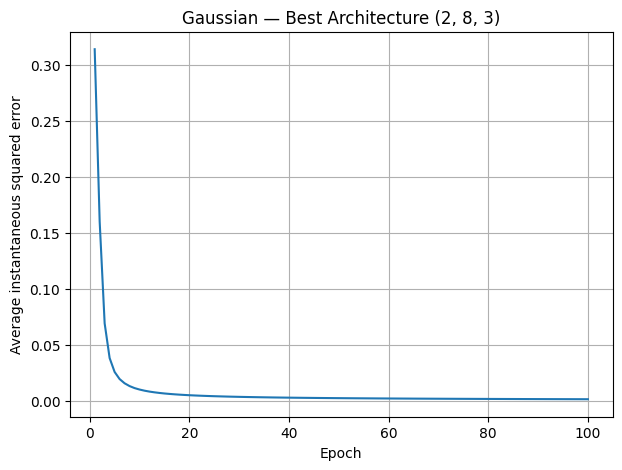

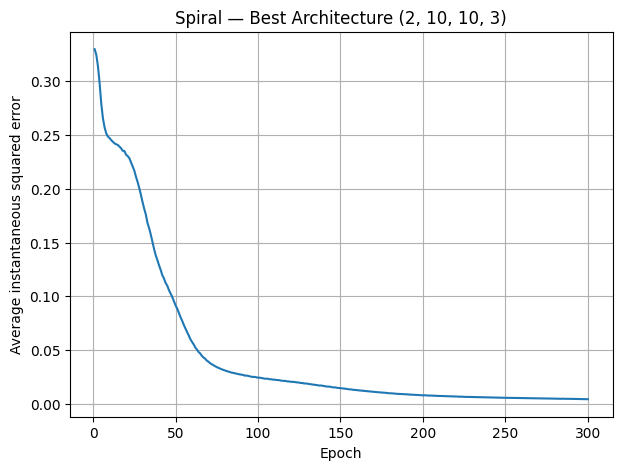

In [ ]:
def plot_best_error(best_result, title):
    plt.figure(figsize=(7, 5))
    plt.plot(
        np.arange(1, len(best_result["history"]) + 1),
        best_result["history"]
    )
    plt.xlabel("Epoch")
    plt.ylabel("Average instantaneous squared error")
    plt.title(title)
    plt.grid(True)
    plt.show()


plot_best_error(
    gaussian_best,
    f"Gaussian — Best Architecture {gaussian_best['architecture']}"
)

plot_best_error(
    spiral_best,
    f"Spiral — Best Architecture {spiral_best['architecture']}"
)


## 9. Validation confusion matrices for all architectures

In [ ]:
def show_architecture_results(results, title):
    print(title)
    print("=" * len(title))

    for result in results:
        arch = result["architecture"]
        acc = result["val_accuracy"]
        cm = result["val_confusion_matrix"]

        print(f"Architecture: {arch}")
        print(f"Validation accuracy: {acc * 100:.2f}%")
        print(cm)
        print()


show_architecture_results(
    gaussian_results,
    "Gaussian Architecture Results"
)

show_architecture_results(
    spiral_results,
    "Spiral Architecture Results"
)


Gaussian Architecture Results
Architecture: (2, 3, 3)
Validation accuracy: 99.67%
[[ 99   1   0]
 [  0 100   0]
 [  0   0 100]]

Architecture: (2, 5, 3)
Validation accuracy: 99.67%
[[ 99   1   0]
 [  0 100   0]
 [  0   0 100]]

Architecture: (2, 8, 3)
Validation accuracy: 100.00%
[[100   0   0]
 [  0 100   0]
 [  0   0 100]]

Architecture: (2, 10, 3)
Validation accuracy: 100.00%
[[100   0   0]
 [  0 100   0]
 [  0   0 100]]

Architecture: (2, 15, 3)
Validation accuracy: 100.00%
[[100   0   0]
 [  0 100   0]
 [  0   0 100]]

Architecture: (2, 20, 3)
Validation accuracy: 100.00%
[[100   0   0]
 [  0 100   0]
 [  0   0 100]]

Spiral Architecture Results
Architecture: (2, 5, 5, 3)
Validation accuracy: 98.67%
[[ 96   4   0]
 [  0 100   0]
 [  0   0 100]]

Architecture: (2, 8, 8, 3)
Validation accuracy: 97.67%
[[ 96   3   1]
 [  0 100   0]
 [  1   2  97]]

Architecture: (2, 10, 10, 3)
Validation accuracy: 100.00%
[[100   0   0]
 [  0 100   0]
 [  0   0 100]]

Architecture: (2, 15, 10, 3)
Val

## 10. Best architecture: validation and test results

===== Gaussian Dataset =====
Best architecture: (2, 8, 3)

Validation accuracy: 100.00%
Validation confusion matrix:
[[100   0   0]
 [  0 100   0]
 [  0   0 100]]

Test accuracy: 100.00%
Test confusion matrix:
[[100   0   0]
 [  0 100   0]
 [  0   0 100]]


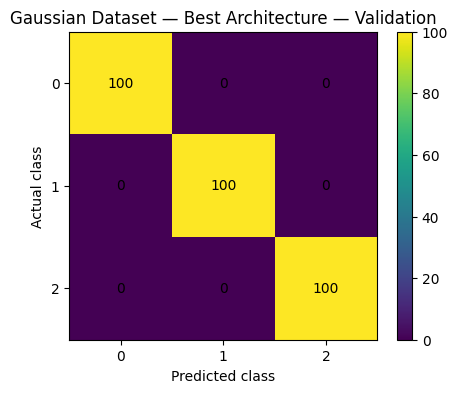

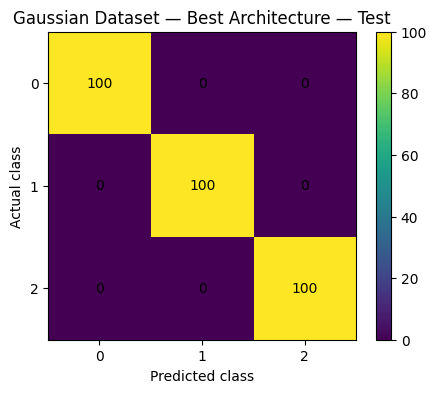

===== Spiral Dataset =====
Best architecture: (2, 10, 10, 3)

Validation accuracy: 100.00%
Validation confusion matrix:
[[100   0   0]
 [  0 100   0]
 [  0   0 100]]

Test accuracy: 100.00%
Test confusion matrix:
[[100   0   0]
 [  0 100   0]
 [  0   0 100]]


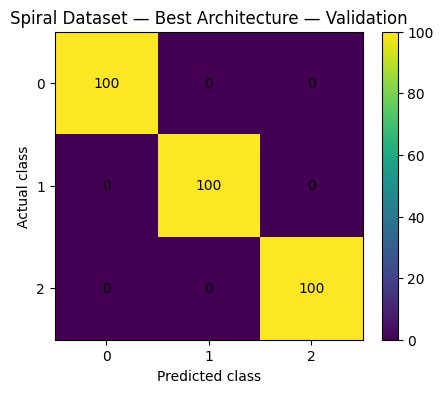

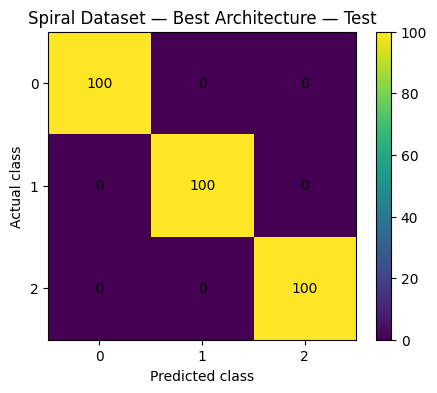

In [ ]:
def evaluate_best(data, best_result, models, dataset_name):
    model = models[best_result["architecture"]]

    print(f"===== {dataset_name} =====")
    print("Best architecture:", best_result["architecture"])
    print()

    val_acc, val_cm = evaluate(
        model,
        data["X_val"],
        data["y_val"]
    )

    test_acc, test_cm = evaluate(
        model,
        data["X_test"],
        data["y_test"]
    )

    print("Validation accuracy:", f"{val_acc * 100:.2f}%")
    print("Validation confusion matrix:")
    print(val_cm)
    print()

    print("Test accuracy:", f"{test_acc * 100:.2f}%")
    print("Test confusion matrix:")
    print(test_cm)

    plot_confusion_matrix(
        val_cm,
        f"{dataset_name} — Best Architecture — Validation"
    )

    plot_confusion_matrix(
        test_cm,
        f"{dataset_name} — Best Architecture — Test"
    )

    return model


best_gaussian_model = evaluate_best(
    datasets["Gaussian"],
    gaussian_best,
    gaussian_models,
    "Gaussian Dataset"
)

best_spiral_model = evaluate_best(
    datasets["Spiral"],
    spiral_best,
    spiral_models,
    "Spiral Dataset"
)


## 11. Decision regions for the best architectures

The assignment asks for decision regions superimposed with **training data**.

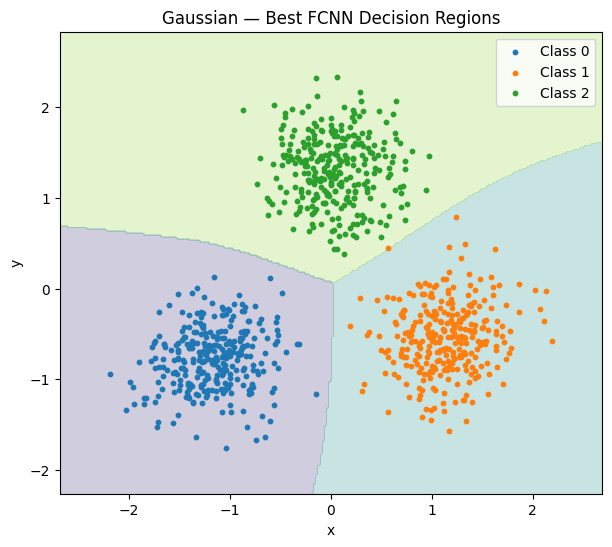

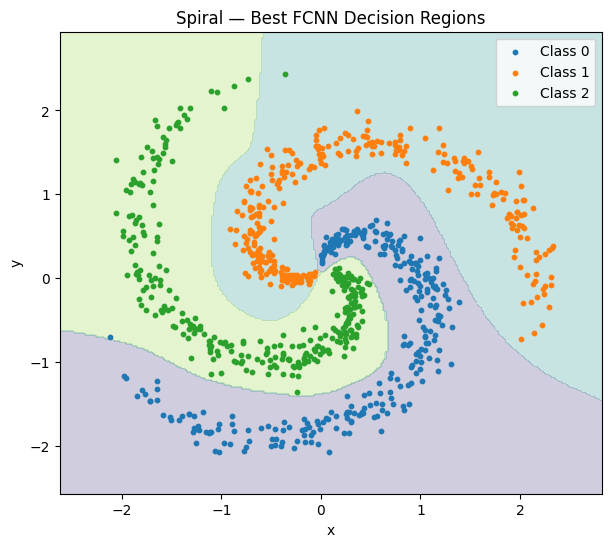

In [ ]:
plot_decision_regions(
    best_gaussian_model,
    datasets["Gaussian"]["X_train"],
    datasets["Gaussian"]["y_train"],
    "Gaussian — Best FCNN Decision Regions"
)

plot_decision_regions(
    best_spiral_model,
    datasets["Spiral"]["X_train"],
    datasets["Spiral"]["y_train"],
    "Spiral — Best FCNN Decision Regions"
)


## 12. Hidden-node and output-node plots

The assignment requests these for training, validation and test data. The function below is called separately for each split.

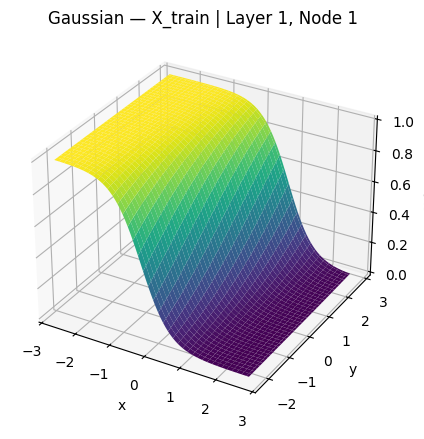

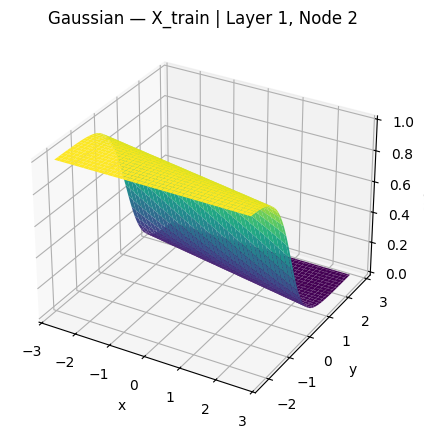

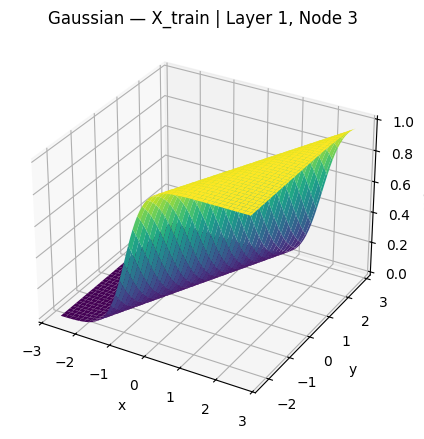

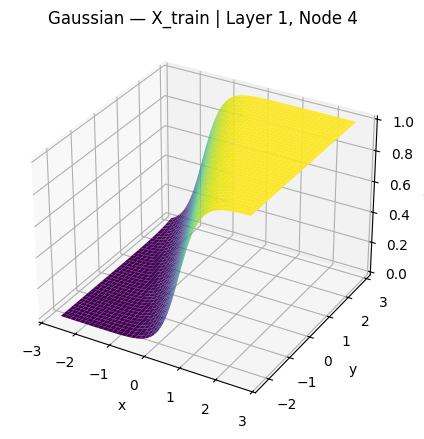

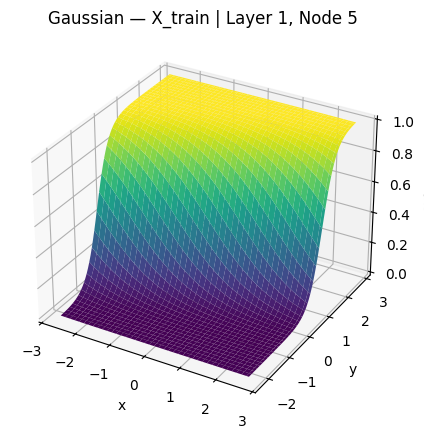

...

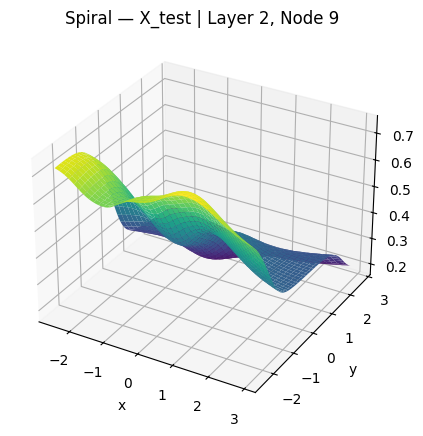

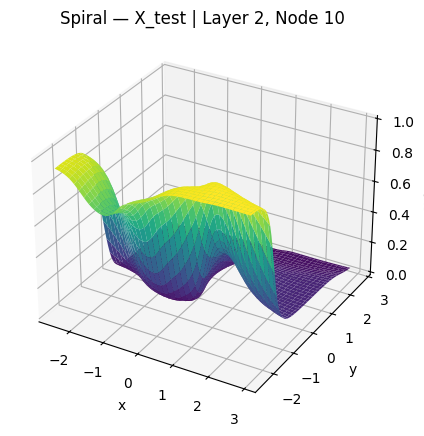

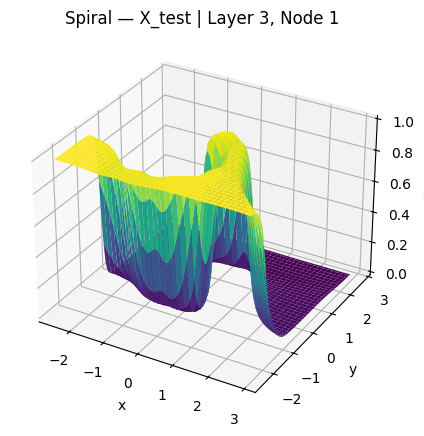

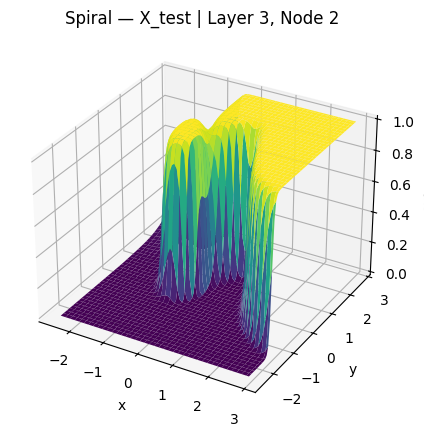

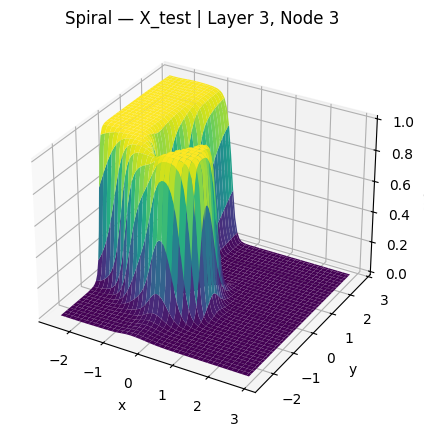

In [ ]:
for split_name in ["X_train", "X_val", "X_test"]:
    plot_node_outputs(
        best_gaussian_model,
        datasets["Gaussian"][split_name],
        f"Gaussian — {split_name}"
    )

for split_name in ["X_train", "X_val", "X_test"]:
    plot_node_outputs(
        best_spiral_model,
        datasets["Spiral"][split_name],
        f"Spiral — {split_name}"
    )


## 13. Single-neuron / linear-model comparison

In [ ]:
class SingleNeuronClassifier:
    """Three-output single-neuron layer: no hidden layer."""

    def __init__(self, input_dim=2, output_dim=3, seed=10, learning_rate=0.05):
        rng = np.random.default_rng(seed)
        limit = np.sqrt(6.0 / (input_dim + output_dim))

        self.W = rng.uniform(-limit, limit, (input_dim, output_dim))
        self.b = np.zeros((1, output_dim))
        self.learning_rate = learning_rate

    def forward(self, X):
        return sigmoid(X @ self.W + self.b)

    def predict(self, X):
        return np.argmax(self.forward(X), axis=1)

    def train(self, X, y, epochs=100):
        Y = one_hot(y, 3)
        history = []

        for epoch in range(epochs):
            idx = np.arange(len(X))
            np.random.shuffle(idx)

            total_loss = 0.0

            for i in idx:
                x = X[i:i+1]
                target = Y[i:i+1]

                output = self.forward(x)

                delta = (output - target) * sigmoid_derivative(output)

                self.W -= self.learning_rate * (x.T @ delta)
                self.b -= self.learning_rate * delta

                total_loss += 0.5 * np.sum((target - output) ** 2)

            history.append(total_loss / len(X))

        return history


def compare_with_single_neuron(data, fcnn_model, name):
    single = SingleNeuronClassifier(seed=10, learning_rate=0.05)
    single.train(data["X_train"], data["y_train"], epochs=100)

    fcnn_train = accuracy(
        data["y_train"],
        fcnn_model.predict(data["X_train"])
    )
    fcnn_test = accuracy(
        data["y_test"],
        fcnn_model.predict(data["X_test"])
    )

    single_train = accuracy(
        data["y_train"],
        single.predict(data["X_train"])
    )
    single_test = accuracy(
        data["y_test"],
        single.predict(data["X_test"])
    )

    print(f"===== {name} =====")
    print(f"FCNN       | Train: {fcnn_train*100:.2f}% | Test: {fcnn_test*100:.2f}%")
    print(f"Single     | Train: {single_train*100:.2f}% | Test: {single_test*100:.2f}%")

    return single


single_gaussian = compare_with_single_neuron(
    datasets["Gaussian"],
    best_gaussian_model,
    "Gaussian"
)

single_spiral = compare_with_single_neuron(
    datasets["Spiral"],
    best_spiral_model,
    "Spiral"
)


===== Gaussian =====
FCNN       | Train: 99.89% | Test: 100.00%
Single     | Train: 99.89% | Test: 99.67%
===== Spiral =====
FCNN       | Train: 99.78% | Test: 100.00%
Single     | Train: 51.89% | Test: 46.00%


## 14. Summary table

Run this cell after training to collect the main architecture-selection results.

In [ ]:
def summary_table(results):
    print(f"{'Architecture':<25} {'Train Acc':>12} {'Val Acc':>12}")
    print("-" * 52)

    for r in results:
        print(
            f"{str(r['architecture']):<25} "
            f"{r['train_accuracy']*100:>10.2f}% "
            f"{r['val_accuracy']*100:>10.2f}%"
        )


summary_table(gaussian_results)
print()
summary_table(spiral_results)


Architecture                 Train Acc      Val Acc
----------------------------------------------------
(2, 3, 3)                     100.00%      99.67%
(2, 5, 3)                     100.00%      99.67%
(2, 8, 3)                      99.89%     100.00%
(2, 10, 3)                    100.00%     100.00%
(2, 15, 3)                     99.89%     100.00%
(2, 20, 3)                     99.89%     100.00%

Architecture                 Train Acc      Val Acc
----------------------------------------------------
(2, 5, 5, 3)                   99.11%      98.67%
(2, 8, 8, 3)                   99.00%      97.67%
(2, 10, 10, 3)                 99.78%     100.00%
(2, 15, 10, 3)                 99.89%     100.00%
(2, 15, 15, 3)                 99.78%     100.00%
(2, 20, 15, 3)                 99.89%     100.00%
(2, 20, 20, 3)                 99.89%      99.67%
